## Exploratory Data Analysis and Model Selection Strategy

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plot

In [4]:
data = pd.read_csv("../../data/raw/retail_trader_master.csv")

data.info()

<class 'pandas.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 24 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   trader_id                   50000 non-null  str    
 1   age                         50000 non-null  int64  
 2   prior_experience_years      50000 non-null  float64
 3   starting_capital            50000 non-null  float64
 4   account_age_months          50000 non-null  int64  
 5   instrument                  50000 non-null  str    
 6   market_regime               50000 non-null  str    
 7   broker_cost_bps             50000 non-null  float64
 8   risk_per_trade_pct          50000 non-null  float64
 9   avg_leverage                50000 non-null  float64
 10  trades_per_month            50000 non-null  int64  
 11  uses_stop_loss              50000 non-null  int64  
 12  avg_win_hold_days           50000 non-null  float64
 13  avg_loss_hold_days          50000 non-null

In [5]:
#the percentage of 1 values for blew_up column
float(((data["blew_up"] == 1).sum() / len(data["blew_up"])) * 100)

45.074

In [6]:
data.isna().sum()

trader_id                     0
age                           0
prior_experience_years        0
starting_capital              0
account_age_months            0
instrument                    0
market_regime                 0
broker_cost_bps               0
risk_per_trade_pct            0
avg_leverage                  0
trades_per_month              0
uses_stop_loss                0
avg_win_hold_days             0
avg_loss_hold_days            0
diversification               0
journals_trades               0
revenge_trading               0
overconfidence                0
follows_plan                  0
chases_volatility             0
position_sizing_discipline    0
net_return_pct                0
profitable                    0
blew_up                       0
dtype: int64

In [7]:
data.duplicated().sum()

np.int64(0)

In [8]:
data.describe()

,age,prior_experience_years,starting_capital,account_age_months,broker_cost_bps,risk_per_trade_pct,avg_leverage,trades_per_month,uses_stop_loss,avg_win_hold_days,...,diversification,journals_trades,revenge_trading,overconfidence,follows_plan,chases_volatility,position_sizing_discipline,net_return_pct,profitable,blew_up
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,34.275840,2.231926,8918.229600,16.081660,12.012688,2.205167,6.138308,32.454440,0.519520,6.442136,...,4.033222,0.595880,5.006670,5.009076,5.344228,6.901380,7.380318,-21.352936,0.182380,0.450740
std,9.509957,1.880017,12180.900355,12.714182,8.449540,1.557809,5.753343,24.045368,0.499624,5.102338,...,2.120679,0.730135,2.238368,2.161649,2.267644,2.152017,2.117786,19.879813,0.386161,0.497573
min,18.000000,0.000000,200.000000,1.000000,0.500000,0.100000,1.000000,1.000000,0.000000,0.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-62.000000,0.000000,0.000000
25%,27.000000,0.900000,2757.500000,7.000000,5.800000,1.060000,1.700000,15.000000,0.000000,2.700000,...,2.500000,0.000000,3.500000,3.500000,3.800000,5.400000,5.900000,-40.000000,0.000000,0.000000
50%,34.000000,1.700000,5390.000000,13.000000,10.100000,1.850000,4.200000,27.000000,1.000000,5.200000,...,4.000000,0.000000,5.000000,5.000000,5.400000,7.000000,7.600000,-24.900000,0.000000,0.000000
75%,41.000000,3.100000,10590.000000,22.000000,16.200000,2.960000,8.800000,44.000000,1.000000,8.800000,...,5.500000,1.000000,6.600000,6.500000,6.900000,8.600000,9.300000,-4.300000,0.000000,1.000000
max,75.000000,21.300000,401450.000000,120.000000,60.000000,15.570000,55.400000,251.000000,1.000000,60.000000,...,10.000000,2.000000,10.000000,10.000000,10.000000,10.000000,10.000000,45.400000,1.000000,1.000000


In [9]:
data[[
    "age",
    "prior_experience_years",
    "starting_capital",
    "account_age_months",
    "broker_cost_bps",
    "risk_per_trade_pct",
    "avg_leverage",
    "trades_per_month",
    "avg_win_hold_days",
    "avg_loss_hold_days",
    "diversification",
    "revenge_trading",
    "overconfidence",
    "follows_plan",
    "chases_volatility",
    "position_sizing_discipline",
    "net_return_pct"
]].agg(["min", "max"])

,age,prior_experience_years,starting_capital,account_age_months,broker_cost_bps,risk_per_trade_pct,avg_leverage,trades_per_month,avg_win_hold_days,avg_loss_hold_days,diversification,revenge_trading,overconfidence,follows_plan,chases_volatility,position_sizing_discipline,net_return_pct
min,18,0.0,200.0,1,0.5,0.10,1.0,1,0.1,0.1,0.0,0.0,0.0,0.0,0.0,0.0,-62.0
max,75,21.3,401450.0,120,60.0,15.57,55.4,251,60.0,90.0,10.0,10.0,10.0,10.0,10.0,10.0,45.4


In [10]:
checks = {
    "age": (data["age"] < 18) | (data["age"] > 100),
    "prior_experience_years": data["prior_experience_years"] < 0,
    "starting_capital": data["starting_capital"] <= 0,
    "account_age_months": data["account_age_months"] < 0,
    "broker_cost_bps": data["broker_cost_bps"] < 0,
    "risk_per_trade_pct": (data["risk_per_trade_pct"] < 0) |
                           (data["risk_per_trade_pct"] > 100),
    "avg_leverage": data["avg_leverage"] < 0,
    "trades_per_month": data["trades_per_month"] < 0,
    "avg_win_hold_days": data["avg_win_hold_days"] < 0,
    "avg_loss_hold_days": data["avg_loss_hold_days"] < 0,
    "revenge_trading": (data["revenge_trading"] < 0) |
                       (data["revenge_trading"] > 10),
    "overconfidence": (data["overconfidence"] < 0) |
                      (data["overconfidence"] > 10),
    "follows_plan": (data["follows_plan"] < 0) |
                    (data["follows_plan"] > 10),
    "chases_volatility": (data["chases_volatility"] < 0) |
                         (data["chases_volatility"] > 10),
    "position_sizing_discipline": (
        (data["position_sizing_discipline"] < 0) |
        (data["position_sizing_discipline"] > 10)
    ),
    "profitable": ~data["profitable"].isin([0, 1]),
    "blew_up": ~data["blew_up"].isin([0, 1])
}

range_violations = {
    column: condition.sum()
    for column, condition in checks.items()
}

pd.Series(range_violations).sort_values(ascending=False)

age                           0
avg_loss_hold_days            0
profitable                    0
position_sizing_discipline    0
chases_volatility             0
follows_plan                  0
overconfidence                0
revenge_trading               0
avg_win_hold_days             0
prior_experience_years        0
trades_per_month              0
avg_leverage                  0
risk_per_trade_pct            0
broker_cost_bps               0
account_age_months            0
starting_capital              0
blew_up                       0
dtype: int64

In [12]:
column = "starting_capital"

q1 = data[column].quantile(0.25)
q3 = data[column].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

outliers = data[
    (data[column] < lower_bound) |
    (data[column] > upper_bound)
]

outliers.head()

,trader_id,age,prior_experience_years,starting_capital,account_age_months,instrument,market_regime,broker_cost_bps,risk_per_trade_pct,avg_leverage,...,diversification,journals_trades,revenge_trading,overconfidence,follows_plan,chases_volatility,position_sizing_discipline,net_return_pct,profitable,blew_up
10,TRD000010,39,4.6,27490.0,25,stocks,bull,2.0,0.16,1.0,...,5.4,1,4.8,3.5,2.8,10.0,10.0,-11.7,0,0
18,TRD000018,37,2.7,25150.0,3,options,choppy,24.2,0.98,23.8,...,2.9,0,2.9,3.3,5.1,9.7,10.0,-40.0,0,1
24,TRD000024,26,0.8,54890.0,10,crypto,bull,10.0,2.44,6.2,...,4.5,0,6.8,10.0,5.5,10.0,9.1,-40.0,0,1
27,TRD000027,40,1.0,30990.0,8,options,bull,15.3,1.19,11.3,...,0.2,1,1.5,2.3,6.4,2.6,9.6,-13.9,0,0
38,TRD000038,36,1.6,42640.0,18,stocks,choppy,8.2,1.41,2.8,...,8.9,1,6.6,2.1,3.9,5.6,6.2,6.1,1,0


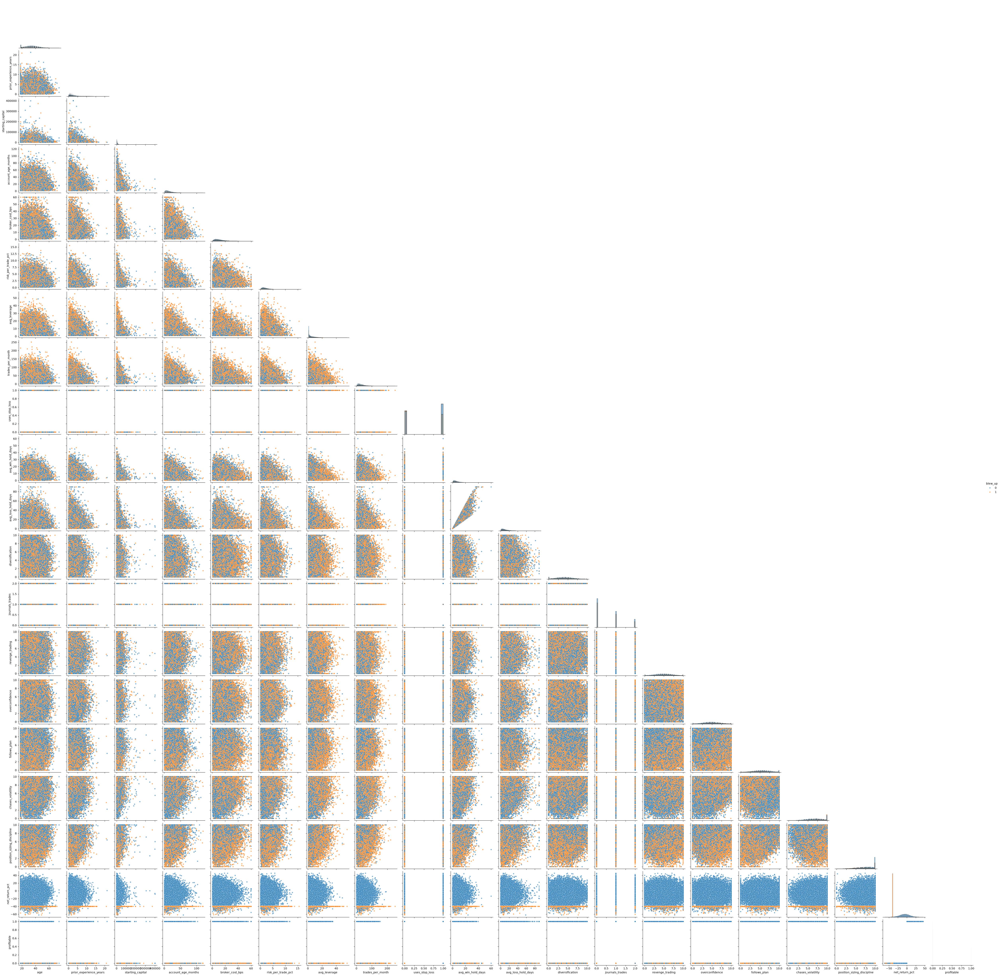

In [4]:
import seaborn as sns

numeric_columns = data.select_dtypes(include="number").columns.tolist()

sns.pairplot(
    data[numeric_columns],
    hue="blew_up",
    corner=True,
    diag_kind="hist",
    plot_kws={
        "alpha": 0.6,
        "s": 20
    }
)

plot.show()

The scatter plot suggests that the relationship between the features and the `blew_up` target is not purely linear. There are overlapping classes, nonlinear patterns, and possible interactions between variables. Therefore, a simple Logistic Regression model may not capture the underlying structure effectively. KNN and linear SVM may also perform poorly because of feature scaling, class overlap, and the high dimensionality of the dataset.

As a result, a tree-based ensemble method, such as Random Forest or Gradient Boosting, appears to be the most suitable initial approach because it can model nonlinear relationships and feature interactions without assuming a linear decision boundary.

Before training the models, I will remove the `net_return_pct` and `profitable` columns. These variables are calculated after the trading period has ended and are directly related to the final outcome. Keeping them could cause data leakage, allowing the model to use information that would not be available when predicting whether a trader will eventually blow up. Removing them will make the evaluation more realistic and reliable.